# A Model to calculate student learning outcomes output

### 0. Import Packages

In [125]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing as pp

### 1. Read Dataset

In [126]:
df1 = pd.read_csv(r'C:\C_partI.csv',parse_dates=[0, 2], index_col=[0],header=0,names=["hours",'money','discussion','exam','practice','self-rate','feeling','learnt','apply','performance'])
df2 = pd.read_csv(r'c:\C_partII.csv',parse_dates=[0, 2], index_col=[0],header=0,names=["hours",'money','discussion','exam','practice','assignment','mid-term','final','rank'])
df3 = pd.read_csv('C:\\O_partI.csv',parse_dates=[0, 2], index_col=[0],header=0,names=["hours",'money','discussion','exam','practice','self-rate','feeling','learnt','apply','performance'])
df4 = pd.read_csv('C:/O_partII.csv',parse_dates=[0, 2], index_col=[0],header=0,names=["hours",'money','discussion','exam','practice','assignment','mid-term','final','rank'])
df2['hours']=df2['hours'].astype(str).astype(float)
df2['hours']=df2['hours'].astype(str).astype(float)
df2['hours']=df2['hours'].astype(str).astype(float)
#Just record four way to open the csv data in windows C direcotry

#There may be a probelm of unknown time zone warning, you can ignore that.

C:\Users\louie\Anaconda3\lib\site-packages\dateutil\parser\_parser.py:1204: UnknownTimezoneWarning: tzname MDT identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.
  category=UnknownTimezoneWarning)


### 2. Some basic data clean and process

In [127]:
# df2 and df4 have numerical data and df1 and df3 have string data.
# transfer all the data in d2 and d4 to float
df2=df2.astype(str).astype(float)
df4=df4.astype(str).astype(float)
# transfer all the data in d1 and d2 to binary data
df1[df1== 'Much (>10hrs)']=1.0 
df1[df1== 'Much (>10 hrs)']=1.0 
df1[df1== 'Much (>2 hrs)']=1.0 
df1[df1== 'Much (>$200)']=1.0 
df1[df1=='Good']=1.0
df1[df1=='Much']=1.0
df1[df1=='OK (5~10 hrs)']=2.0
df1[df1=='OK ($50~200)']=2.0
df1[df1=='OK']=2.0
df1[df1=='OK (1~2hrs)']=2.0
df1[df1=='Little (<5 hrs)']=3.0
df1[df1=='Little (<$50)']=3.0
df1[df1=='Little (< 1 hrs)']=3.0
df1[df1=='Little (<1 hrs)']=3.0
df1[df1=='Little']=3.0
df1[df1=='Bad']=3.0
    
df3[df3== 'Much (>10hrs)']=1.0 
df3[df3== 'Much (>10 hrs)']=1.0 
df3[df3== 'Much (>2 hrs)']=1.0 
df3[df3== 'Much (>$200)']=1.0 
df3[df3=='Good']=1.0
df3[df3=='Much']=1.0
df3[df3=='OK (5~10 hrs)']=2.0
df3[df3=='OK ($50~200)']=2.0
df3[df3=='OK']=2.0
df3[df3=='OK (1~2hrs)']=2.0
df3[df3=='Little (<5 hrs)']=3.0
df3[df3=='Little (<$50)']=3.0
df3[df3=='Little (< 1 hrs)']=3.0
df3[df3=='Little (<1 hrs)']=3.0
df3[df3=='Little']=3.0
df3[df3=='Bad']=3.0

df1=df1.astype(str).astype(float)
df3=df3.astype(str).astype(float)

### 3. Put into Model

#### 3.1 Sigmoid Fuction

In [128]:
def sigmoid(z):
    return 1/(1+np.exp(-z))

#### Sigmoid function is used to map the predication results to probility.

#### 3.2 Predication Fuction

In [129]:
def model(X, theta):
    return sigmoid(np.dot(X, theta.T))

#### The independent variable z is defined as theta, which is the parameter that we  can get by machine learning.

In [130]:
df2.insert(0, 'Ones', 1) # Put one column in colume 0 and name it as 'Ones', the value are all 1.
df4.insert(0, 'Ones', 1) # Put one column in colume 0 and name it as 'Ones', the value are all 1.

#df2 and df4 are calculated at the same time with the same method (Noticing that the dimensions of df2 and df4 are different).
# set X (training data) and y (target variable)
#orig_data = df2.as_matrix() # convert the Pandas representation of the data to an array useful for further computations
orig_data = df4.as_matrix() # convert the Pandas representation of the data to an array useful for further computations

#x_row=30
x_row=75
 
orig_data = pp.scale(orig_data)


orig_data=orig_data[0:x_row,:]

#cols = 11#orig_data.shape[1]
#X = orig_data[:,0:cols-3]
#y = orig_data[:,cols-3:cols-2]

cols1 = 11#orig_data1.shape[1]
X = orig_data[:,0:cols-3]
y = orig_data[:,cols-3:cols-2]
 
theta = np.zeros([1, 8])  # initialize theta as a function of six spending variables

len(X)

C:\Users\louie\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


75

#### 3.3 Cost Function

In [131]:
def cost(X, y, theta):
    left = np.multiply(-y, np.log(model(X, theta)))
    right = np.multiply(1 - y, np.log(1 - model(X, theta)))
    return np.sum(left - right) / (len(X))

#### The initial value of cost

In [132]:
cost(X, y, theta)

0.6931471805599455

In [133]:
STOP_ITER = 0
STOP_COST = 1
STOP_GRAD = 2

def stopCriterion(type, value, threshold):
# Here we set three kinds of strategy to let the learning process stop
    if type == STOP_ITER:        return value > threshold
    elif type == STOP_COST:      return abs(value[-1]-value[-2]) < threshold
    elif type == STOP_GRAD:      return np.linalg.norm(value) < threshold 
import numpy.random

# Shuffle the data
def shuffleData(data):
    np.random.shuffle(data)
    cols = 11#orig_data.shape[1]
    X = orig_data[:,0:cols-3]
    y = orig_data[:,cols-3:cols-2]
    return X, y
 
import time

def gradient(x,y,theta):
    #xTrans = x.transpose()
    print('x',x)
    hypothesis = np.dot(x, theta.T)
    print('hypothesis',hypothesis)
    loss = hypothesis - y
    print('loss',loss)
    gradient = np.dot(x.T, loss) / (len(X))
    print('gradient',gradient)
    return gradient.T

def descent(data, theta, batchSize, stopType, thresh, alpha,n):
    #Here we use the gradient descent
    init_time = time.time()
    print('theta',theta)
    i = 0 # iterations
    k = 0 # batch
    X, y = shuffleData(data)
    grad = np.zeros(theta.shape) # gradient
    costs = [cost(X, y, theta)] # cost
 
    while True:
        grad = gradient(X[k:k+batchSize], y[k:k+batchSize], theta)
        k += batchSize  #The numaer of data equals to batch
        if k >= n:    # sample numbers
            k = 0 
            X, y = shuffleData(data) #shuffle again
        theta = theta - alpha*grad # improving the parameters
        costs.append(cost(X, y, theta)) # Getting the new cost
        i += 1 
 
        if stopType == STOP_ITER:       value = i
        elif stopType == STOP_COST:     value = costs
        elif stopType == STOP_GRAD:     value = grad
        if stopCriterion(stopType, value, thresh): break
    
    return theta, i-1, costs, grad, time.time() - init_time
 
def run(data, theta, batchSize, stopType, thresh, alpha,n):
    theta, iter, costs, grad, dur = descent(data, theta, batchSize, stopType, thresh, alpha, n)
    fig, ax = plt.subplots(figsize=(12,4))
    print('costs',costs)
    ax.plot(np.arange(len(costs)), costs, 'r')
    ax.set_xlabel('Iterations',fontsize=26)
    ax.set_ylabel('Cost',fontsize=26)
    ax.tick_params(labelsize=15)
  #  ax.set_title(name.upper() + ' - Error vs. Iteration')
    return theta

In [134]:
print(len(orig_data), len(orig_data[0]))
print(theta)

75 10
[[0. 0. 0. 0. 0. 0. 0. 0.]]


#### Get the results

theta [[0. 0. 0. 0. 0. 0. 0. 0.]]
x [[ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.415

x [[ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.

x [[ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53

loss [[ 1.46419949]
 [ 1.68450824]
 [-0.90877952]
 [-0.7943998 ]
 [ 0.59691665]
 [ 0.17240986]
 [ 1.79070686]
 [-0.36438042]
 [-1.12239477]
 [-0.3669378 ]]
gradient [[ 0.        ]
 [-0.00175391]
 [ 0.08297901]
 [ 0.05531842]
 [ 0.01286273]
 [ 0.09212073]
 [-0.02496227]
 [-0.15846595]]
x [[ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.

x [[ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]]
hypothesis [[ 2.42108306e-03]
 [-5.76239516e-05]
 [-8.41205457e-04]
 [-4.98300924e-03]
 [-9.42085806e-05]]
loss [[-0.69035839]
 [-0.26030048]
 [ 0.2795867 ]
 [-0.69776248]
 [-0.36847122]]
gradient [[ 0.        ]
 [ 0.01109677]
 [-0.01461399]
 [-0.00307342]
 [ 0.01187432]
 [ 0.00596049]
 [ 0.01084683]
 [-0.00051036]]
x [[ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578

gradient [[ 0.        ]
 [-0.08017489]
 [-0.05879196]
 [-0.03282758]
 [ 0.02592416]
 [-0.0089432 ]
 [-0.03140238]
 [-0.06909098]]
x [[ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767

x [[ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -

x [[ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -

   0.02528239  0.79505193]]
hypothesis [[-0.00527418]
 [ 0.01130351]
 [ 0.00970259]
 [-0.00971468]
 [ 0.00811091]
 [ 0.00130042]
 [ 0.00093542]
 [ 0.00116974]
 [ 0.00583341]
 [ 0.00760009]]
loss [[ 0.70769034]
 [-0.68147596]
 [-0.89934519]
 [-0.70249415]
 [-0.3602661 ]
 [ 0.38986248]
 [-0.25930744]
 [-0.90787804]
 [-1.01134852]
 [-1.11771599]]
gradient [[ 0.        ]
 [-0.0352008 ]
 [ 0.03422338]
 [ 0.00190592]
 [ 0.01304804]
 [ 0.07146582]
 [-0.04908797]
 [-0.02532693]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]
 [ 0.         -0.9

x [[ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.5053578
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0

x [[ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.65568432 -0.30675378  0.93031777
   0.67913722 -1.1782784 ]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.

loss [[ 1.4449767 ]
 [ 0.60828391]
 [-0.3503614 ]
 [ 1.44507491]
 [-1.00484227]
 [ 0.61329943]
 [ 0.68409048]
 [-0.26040491]
 [ 0.60328776]
 [-0.67844482]]
gradient [[ 0.        ]
 [-0.03424546]
 [-0.0725084 ]
 [-0.10160328]
 [-0.0792465 ]
 [-0.07057529]
 [-0.01514668]
 [-0.09053646]]
x [[ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0. 

 [-0.02027939]]
loss [[-1.11367121]
 [-0.79939745]
 [-0.34840465]
 [ 0.68086692]
 [-0.8959566 ]
 [ 1.44216688]
 [-0.90723019]
 [-0.35739833]
 [ 1.77997259]
 [ 0.26014851]]
gradient [[ 0.        ]
 [-0.06754484]
 [-0.01587844]
 [-0.03384133]
 [ 0.01721777]
 [ 0.0114293 ]
 [-0.04540802]
 [-0.10442085]]
x [[ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0

x [[ 0.         -0.96902351  0.56240506  0.93430371  0.52480767  0.93031777
   0.02528239  1.13823981]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281  0.83541723 -0.45879328  0.24762052  0.64318266
  -2.59013696 -1.60726325]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  

x [[ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]]
hypothesis [[ 0.00216419]
 [ 0.01857382]
 [ 0.01528496]
 [-0.03664347]
 [ 0.01361921]]
loss [[-0.90688359]
 [-0.67420565]
 [-0.89376282]
 [ 0.56818689]
 [-1.11169687]]
gradient [[ 0.        ]
 [-0.03113886]
 [-0.00265799]
 [-0.02627679]
 [-0.00904325]
 [ 0.04881688]
 [-0.02991802]
 [-0.02991363]]
x [[ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.

gradient [[ 0.        ]
 [ 0.04437969]
 [-0.03399593]
 [-0.05640858]
 [-0.02435826]
 [ 0.01175544]
 [ 0.01122326]
 [-0.06103363]]
x [[ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.93031777
   1.07145013  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482

   0.15605335  0.2802701 ]]
hypothesis [[-0.0142121 ]
 [-0.03703483]
 [-0.00322083]
 [ 0.00391159]
 [ 0.01850105]
 [-0.01931635]
 [-0.0010697 ]
 [ 0.00158149]
 [ 0.00652544]
 [ 0.00993316]]
loss [[ 0.4824841 ]
 [ 1.43286875]
 [ 0.27720708]
 [ 0.7168761 ]
 [ 0.4070631 ]
 [ 1.77498969]
 [ 0.60376066]
 [-0.90746629]
 [-0.90252234]
 [ 0.50662937]]
gradient [[ 0.        ]
 [-0.06350978]
 [ 0.00013795]
 [ 0.00991814]
 [-0.01848102]
 [-0.00105863]
 [ 0.02016826]
 [-0.07050314]]
x [[ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.

x [[ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0

x [[ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -

   0.67913722 -1.52146628]]
hypothesis [[ 0.01586798]
 [ 0.02187172]
 [ 0.00141672]
 [-0.07228205]
 [ 0.02534655]
 [ 0.02171683]
 [-0.04377782]
 [ 0.00975151]
 [ 0.00318059]
 [-0.01074005]]
loss [[-0.8931798 ]
 [ 0.41043378]
 [-0.90763105]
 [ 2.04642644]
 [-0.34303046]
 [-0.9954651 ]
 [ 1.42612576]
 [-0.35862551]
 [ 0.39174264]
 [ 1.67543184]]
gradient [[ 0.        ]
 [-0.0813473 ]
 [-0.05671544]
 [-0.04956025]
 [-0.01177962]
 [-0.03778313]
 [-0.08117865]
 [-0.11181655]]
x [[ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281 -1.62169227  0.37706492  1.07918197  0.93031777
   0.94067916 -0.5776996 ]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]]
hypothesis [[ 0.

   0.02528239  1.13823981]]
hypothesis [[ 0.01428199]
 [-0.00295185]
 [-0.0013376 ]
 [ 0.01958943]
 [ 0.02078542]
 [ 0.00636723]
 [ 0.02680819]
 [ 0.02769928]
 [-0.0381045 ]
 [ 0.02356897]]
loss [[ 0.40284404]
 [ 0.60187851]
 [ 0.60349276]
 [-1.10572665]
 [-0.3475916 ]
 [-0.68641224]
 [-0.34156882]
 [-0.98948265]
 [ 1.43179908]
 [-0.6692105 ]]
gradient [[ 0.        ]
 [-0.00145736]
 [ 0.05362096]
 [-0.00228272]
 [-0.07155534]
 [ 0.02700927]
 [-0.06537617]
 [-0.05530483]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.

  -0.75934342 -1.77885719]]
hypothesis [[ 0.04553777]
 [ 0.03359385]
 [ 0.02610983]
 [ 0.01932972]
 [ 0.01259837]
 [ 0.02797333]
 [ 0.01981874]
 [ 0.00227631]
 [-0.05509038]
 [-0.05627214]]
loss [[-0.75537585]
 [-0.44291732]
 [-0.88293794]
 [-0.34904729]
 [-0.2476445 ]
 [-0.66480614]
 [-0.99736319]
 [-0.90677146]
 [ 0.54973998]
 [ 0.65669237]]
gradient [[ 0.        ]
 [-0.04499343]
 [-0.05482327]
 [-0.03623939]
 [-0.00837419]
 [ 0.0407744 ]
 [-0.03278824]
 [-0.07300837]]
x [[ 0.          0.23556373  0.01638073 -0.45879328  1.07918197 -1.65389827
  -0.23625955  0.02287919]
 [ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
   1.33299206 -0.49190263]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.         -1.

hypothesis [[-0.02423448]
 [ 0.01355418]
 [-0.03704566]
 [ 0.01664184]
 [ 0.0201276 ]
 [ 0.02360303]
 [ 0.01268112]
 [ 0.0008289 ]
 [-0.0014879 ]
 [-0.09023206]]
loss [[ 0.36432758]
 [ 0.51025039]
 [ 0.24338224]
 [-1.00054009]
 [-0.34824941]
 [-0.56104229]
 [-0.13942759]
 [ 0.17312265]
 [ 0.60334246]
 [ 3.54235457]]
gradient [[ 0.        ]
 [-0.06819585]
 [ 0.06612354]
 [ 0.01746619]
 [ 0.0735792 ]
 [ 0.05394152]
 [-0.13370383]
 [-0.16911551]]
x [[ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430

x [[ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0.79505193]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.          0.23556373  0.01638073 -0.45879328  1.07918197 -1.65389827
  -0.23625955  0.02287919]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281 -1.62169227  0.37706492  1.07918197  0.93031777
   0.94067916 -0.5776996 ]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0

x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.         -0.96902351  0.56240506  0.93430371  0.52480767  0.93031777
   0.02528239  1.13823981]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0

x [[ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0

loss [[-0.66236624]
 [ 0.69521794]
 [-0.34454455]
 [-0.98750924]
 [-0.65554549]
 [-0.65827753]
 [ 2.54724173]
 [ 0.60093654]
 [-0.99736875]
 [-0.26060848]]
gradient [[ 0.        ]
 [ 0.02601144]
 [-0.05167316]
 [ 0.01025694]
 [ 0.01731165]
 [ 0.04322143]
 [ 0.01016546]
 [-0.07817289]]
x [[ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.

x [[ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.

x [[ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.5053578
  -0.23625955  0.62345799]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.93031777
   1.07145013  0.8808489 ]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1

   0.94067916 -0.06291778]]
hypothesis [[ 0.03124143]
 [-0.01462523]
 [ 0.03123517]
 [-0.0055974 ]
 [ 0.02664151]
 [ 0.0333001 ]
 [-0.07800163]
 [ 0.0073507 ]
 [-0.07585473]
 [ 0.01874362]]
loss [[-0.12086728]
 [-0.7074047 ]
 [-0.55341015]
 [ 0.2748305 ]
 [-0.3417355 ]
 [ 0.42186215]
 [ 1.71630441]
 [ 0.72031521]
 [ 0.52897563]
 [-0.5659017 ]]
gradient [[ 0.        ]
 [-0.00220309]
 [-0.01556272]
 [-0.06265712]
 [-0.03525993]
 [-0.00177386]
 [-0.05729503]
 [-0.03865741]]
x [[ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.          0.6

gradient [[ 0.        ]
 [-0.02926431]
 [-0.0108316 ]
 [-0.03523147]
 [-0.0105892 ]
 [ 0.02864051]
 [-0.04358965]
 [-0.01599183]]
x [[ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281 -1.62169227  0.37706492  1.07918197  0.93031777
   0.94067916 -0.5776996 ]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  

gradient [[ 0.        ]
 [-0.00723193]
 [-0.08450872]
 [ 0.04226429]
 [-0.09529126]
 [-0.09880609]
 [-0.13220101]
 [-0.12439362]]
x [[ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.4155023

 [-0.64994301]]
gradient [[ 0.        ]
 [ 0.02721222]
 [ 0.00263886]
 [-0.00040346]
 [-0.05713357]
 [ 0.06026922]
 [-0.04142896]
 [-0.12804221]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.83541723  0.9343

loss [[ 0.35154597]
 [-0.42331542]
 [-0.37085031]
 [-0.7286769 ]
 [ 3.49482918]
 [ 0.55909132]
 [-0.54871054]
 [-0.56317101]
 [-0.240166  ]
 [-0.67167967]]
gradient [[ 0.        ]
 [-0.07021143]
 [-0.00381098]
 [-0.00362442]
 [ 0.04237338]
 [ 0.04640392]
 [-0.11090914]
 [-0.18996814]]
x [[ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0. 

loss [[ 0.51797327]
 [-0.65812331]
 [-0.26071746]
 [ 0.41301891]
 [ 0.22227462]
 [-0.64343349]
 [-0.87152971]
 [ 0.52302656]
 [-0.25283364]
 [ 2.54576626]]
gradient [[ 0.        ]
 [ 0.01661541]
 [-0.04187678]
 [ 0.00432759]
 [ 0.0261954 ]
 [ 0.02092401]
 [-0.00532155]
 [-0.02590881]]
x [[ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]]
hypothesis [[-0.02369772]
 [ 0.03240476]
 [ 0.00284017]
 [ 0.02655319]
 [-0.00141023]]
loss [[ 0.6892668 ]
 [-0.98477717]
 [-0.90620761]
 [-0.99062874]
 [-0.36978724]]
gradient [[ 0.        ]
 [-0.01753542]

x [[ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.         -0.96902351  0.56240506  0.93430371  0.52480767  0.93031777
   0.02528239  1.13823981]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0

   0.94067916  0.19447313]]
hypothesis [[ 0.03586288]
 [ 0.02320445]
 [ 0.04911684]
 [ 0.0224984 ]
 [ 0.04274683]
 [ 0.03919415]
 [ 0.00127052]
 [-0.00265797]
 [ 0.03968274]
 [ 0.04182323]]
loss [[-1.0894532 ]
 [-0.66957502]
 [-0.31926018]
 [ 0.51919461]
 [-0.65003264]
 [-0.11291456]
 [ 0.17356427]
 [-0.37103499]
 [-0.86936504]
 [ 0.43038529]]
gradient [[ 0.        ]
 [-0.00165008]
 [ 0.00583932]
 [ 0.00903075]
 [ 0.00832151]
 [ 0.03133551]
 [-0.01417234]
 [-0.03271605]]
x [[ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.

x [[ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
   1.33299206 -0.49190263]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.93031777
   1.07145013  0

gradient [[ 0.        ]
 [-0.02221098]
 [ 0.002852  ]
 [-0.02713402]
 [ 0.02007358]
 [-0.03346629]
 [-0.0346002 ]
 [-0.0450154 ]]
x [[ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.0791819

gradient [[ 0.        ]
 [ 0.00828782]
 [ 0.02012451]
 [-0.02123615]
 [ 0.00164849]
 [ 0.06546373]
 [-0.04430714]
 [-0.05956314]]
x [[ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.0791819

 [ 1.74416536]]
gradient [[ 0.        ]
 [-0.00965172]
 [-0.06840516]
 [ 0.05062935]
 [-0.04541916]
 [-0.09311775]
 [-0.08812541]
 [-0.13967766]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.          0.63709281  0.83541723 -0.45879328  0.24762052  0.64318266
  -2.59013696 -1.60726325]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281  0.83541723  0.6556

loss [[ 1.37402662]
 [-0.85853   ]
 [-0.32523396]
 [-0.55792167]
 [-0.12711318]
 [-0.7142423 ]
 [ 0.41813782]
 [-0.2350086 ]
 [ 1.68157605]
 [-0.90541654]]
gradient [[ 0.        ]
 [ 0.0118681 ]
 [ 0.01915877]
 [-0.03193852]
 [-0.01126179]
 [-0.02956077]
 [-0.06579758]
 [-0.06112024]]
x [[ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.  

loss [[-0.96820057]
 [-0.3240933 ]
 [-0.53844308]
 [ 1.95571789]
 [-0.55725626]]
gradient [[ 0.        ]
 [-0.00894298]
 [-0.05908714]
 [-0.07077313]
 [-0.02205786]
 [-0.03034854]
 [-0.06585628]
 [-0.07209412]]
x [[ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15

loss [[-0.7944336 ]
 [-0.96691352]
 [ 1.36960397]
 [ 1.66025487]
 [ 3.45050686]
 [-0.67935346]
 [-0.30899381]
 [-0.63423843]
 [ 0.59773596]
 [-0.85442098]]
gradient [[ 0.        ]
 [-0.119929  ]
 [ 0.00822073]
 [-0.03660216]
 [ 0.04533527]
 [ 0.06518118]
 [-0.09142607]
 [-0.22639772]]
x [[ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.23556373  0.01638073 -0.45879328  1.07918197 -1.65389827
  -0.23625955  0.02287919]
 [ 0.          0.63709281  0.83541723  0.65568432 -0.30675378  0.93031777
   0.67913722 -1.1782784 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0. 

 [ 0.02728622]]
loss [[ 0.17383186]
 [-0.2551105 ]
 [ 0.27220859]
 [ 1.67251657]
 [-0.86315406]
 [ 0.68176818]
 [-1.08090266]
 [-0.70314081]
 [ 3.44581734]
 [-0.23295664]]
gradient [[ 0.        ]
 [-0.0813622 ]
 [ 0.10669967]
 [-0.03052148]
 [ 0.03462445]
 [ 0.09071108]
 [-0.16485388]
 [-0.19593008]]
x [[ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.

hypothesis [[ 0.05737894]
 [ 0.02859612]
 [-0.12056749]
 [ 0.02190823]
 [-0.12480217]
 [ 0.00156903]
 [-0.06310571]
 [ 0.04618904]
 [-0.17558457]
 [ 0.0658191 ]]
loss [[-0.85166883]
 [ 0.52529233]
 [ 0.48426287]
 [-0.34646879]
 [ 1.66950386]
 [ 0.17386278]
 [ 0.54172465]
 [-0.21405382]
 [ 1.94312393]
 [-0.62696037]]
gradient [[ 0.        ]
 [-0.07424918]
 [-0.05172666]
 [-0.07313773]
 [-0.01894005]
 [ 0.01316399]
 [-0.12966974]
 [-0.10415796]]
x [[ 0.          0.63709281 -1.62169227  0.37706492  1.07918197  0.93031777
   0.94067916 -0.5776996 ]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]]
hypothesis [[-0.00753923]
 [-0.05146986]
 [ 

hypothesis [[-0.04157337]
 [-0.05270085]
 [ 0.0103138 ]
 [ 0.05403387]
 [-0.06453374]
 [ 0.0789789 ]
 [ 0.02370077]
 [-0.00775196]
 [ 0.05399473]
 [ 0.06733441]]
loss [[ 0.45512284]
 [ 0.3358612 ]
 [-0.24992906]
 [-0.96314805]
 [ 0.54029662]
 [-0.28939811]
 [-0.34467624]
 [ 0.5970784 ]
 [ 0.44255679]
 [-0.62544506]]
gradient [[ 0.        ]
 [-0.02159406]
 [-0.02221712]
 [-0.00956503]
 [-0.02408532]
 [-0.02291039]
 [ 0.00046487]
 [-0.03902026]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.5053578
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.         -0.96902351  0.56240506  0.93430

hypothesis [[ 0.03317388]
 [ 0.05216126]
 [ 0.04443457]
 [ 0.06690701]
 [ 0.06013569]
 [-0.00064847]
 [ 0.04531487]
 [ 0.05243811]
 [ 0.03079096]
 [ 0.05523631]]
loss [[-0.87587389]
 [-0.53248405]
 [-0.32394245]
 [-0.95027491]
 [-0.84891209]
 [-0.26089134]
 [-0.97186706]
 [-0.85660967]
 [-0.55385436]
 [ 0.44379836]]
gradient [[ 0.        ]
 [ 0.00317338]
 [-0.00958121]
 [-0.0260741 ]
 [-0.02558943]
 [-0.02084392]
 [-0.04733768]
 [-0.04214878]]
x [[ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.          0.63709281  0.83541723 -1.2946

   0.94067916 -0.06291778]]
hypothesis [[ 0.00880981]
 [-0.02568659]
 [ 0.01080652]
 [ 0.04630336]
 [ 0.03038841]
 [-0.09805879]
 [-0.0942803 ]
 [ 0.06696514]
 [ 0.05643714]
 [ 0.03143006]]
loss [[-0.90023796]
 [-0.71846606]
 [-0.24943634]
 [-0.97087857]
 [ 0.52708462]
 [ 2.12878386]
 [ 1.37562328]
 [-0.30141187]
 [ 0.4449992 ]
 [-0.55321526]]
gradient [[ 0.        ]
 [ 0.02947163]
 [-0.05230438]
 [ 0.0004833 ]
 [-0.05435713]
 [ 0.0291823 ]
 [-0.07873397]
 [-0.04173024]]
x [[ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.

 [ 0.62100119]]
gradient [[ 0.        ]
 [-0.09121748]
 [ 0.06831446]
 [-0.00807181]
 [ 0.08835104]
 [ 0.03394347]
 [-0.08922222]
 [-0.15591934]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.93031777
   1.07145013  0.8808489 ]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281 -1.62169227 -1.573

 [ 0.45155379]]
gradient [[ 0.        ]
 [-0.02897511]
 [ 0.02983489]
 [ 0.01173136]
 [ 0.066103  ]
 [ 0.0617019 ]
 [-0.08950968]
 [-0.23805268]]
x [[ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281  0.83541723  0.65568432 -0.30675378  0.93031777
   0.67913722 -1.1782784 ]
 [ 0.         -2.9766689   0.83541723  0.934

loss [[-0.90420589]
 [ 0.19280959]
 [-0.64024206]
 [ 0.1740175 ]
 [-0.29758782]
 [-0.32043649]
 [ 0.72719085]
 [-0.79294959]
 [-0.75820649]
 [-0.3933496 ]]
gradient [[ 0.        ]
 [-0.05757345]
 [ 0.00125006]
 [-0.00386948]
 [ 0.02918263]
 [ 0.01573506]
 [ 0.00724856]
 [-0.01311808]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0. 

 [ 0.05677909]]
loss [[ 1.69549382]
 [-0.55089595]
 [-0.63912972]
 [-0.65799187]
 [-0.95632122]
 [-0.72063613]
 [ 0.44991579]
 [-0.34182391]
 [ 0.53225336]
 [-0.09532962]]
gradient [[ 0.        ]
 [ 0.00851615]
 [-0.06635295]
 [-0.02892646]
 [-0.04222826]
 [-0.02902569]
 [ 0.00028982]
 [-0.0691642 ]]
x [[ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.

hypothesis [[-0.06819289]
 [ 0.05863111]
 [ 0.06195826]
 [-0.00959899]
 [-0.00289098]]
loss [[-0.76097236]
 [-0.52601421]
 [ 0.45052031]
 [ 0.27082891]
 [-0.371268  ]]
gradient [[ 0.        ]
 [ 0.00682301]
 [-0.00086221]
 [-0.02072637]
 [-0.00217298]
 [-0.00983615]
 [ 0.019545  ]
 [ 0.00191012]]
x [[ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.5376610

hypothesis [[-0.0290618 ]
 [-0.00298105]
 [ 0.00528137]
 [-0.06957647]
 [ 0.05904895]
 [-0.15013682]
 [ 0.05997095]
 [-0.00071317]
 [-0.00371253]
 [-0.14754113]]
loss [[-0.72184128]
 [-0.37135806]
 [-0.90376641]
 [-0.76235594]
 [-0.09305976]
 [ 1.64416922]
 [-0.84907682]
 [-0.26095603]
 [-0.37208954]
 [ 0.56542339]]
gradient [[ 0.        ]
 [-0.00311219]
 [-0.0033897 ]
 [-0.02538337]
 [ 0.03411344]
 [-0.03184349]
 [-0.07658698]
 [-0.03947376]]
x [[ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   0.28682432  0.79505193]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.         -0.16596535  0.83541723 -0.737412

hypothesis [[ 0.03466847]
 [-0.00075018]
 [ 0.06436509]
 [ 0.0661325 ]
 [ 0.04620438]
 [ 0.05690338]
 [-0.12813015]
 [ 0.04458911]
 [ 0.05192453]
 [ 0.01556591]]
loss [[ 0.53136468]
 [-0.26099304]
 [ 0.45292714]
 [-0.62664697]
 [-0.8628434 ]
 [-0.63587609]
 [ 1.34177343]
 [-0.97259282]
 [-0.31645248]
 [ 0.72853042]]
gradient [[ 0.        ]
 [-0.06902058]
 [-0.01888264]
 [-0.03013811]
 [-0.0522956 ]
 [-0.01615391]
 [-0.04283752]
 [-0.01633972]]
x [[ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281  0.2893929   0.9343

  -0.36703052  0.79505193]]
hypothesis [[ 0.07675596]
 [-0.04018402]
 [ 0.04550939]
 [-0.11000543]
 [ 0.00868585]
 [ 0.01057049]
 [ 0.06581095]
 [ 0.05291272]
 [-0.03027165]
 [ 0.04073074]]
loss [[-0.61602351]
 [ 0.67278049]
 [-0.97167254]
 [ 1.35989815]
 [-0.90036192]
 [-0.89847729]
 [-0.95137098]
 [-0.31546429]
 [-0.72305112]
 [ 0.4292928 ]]
gradient [[ 0.        ]
 [ 0.00163501]
 [ 0.03867863]
 [ 0.05900986]
 [ 0.00434546]
 [ 0.05458902]
 [-0.07803204]
 [-0.04640713]]
x [[ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.23556373  0.01638073 -0.45879328  1.07918197 -1.65389827
  -0.23625955  0.02287919]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]]
hypothesis [[-0.

x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -

x [[ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0.79505193]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0

x [[ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.5053578
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
   1.33299206 -0.49190263]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.

 [-0.07497677]]
x [[ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777


gradient [[ 0.        ]
 [ 0.03257581]
 [-0.01777393]
 [ 0.02579108]
 [ 0.02331197]
 [-0.00532268]
 [-0.06728909]
 [-0.01582415]]
x [[ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.         -1.37055259 -0.5296436   0.93430371  1.07918197  0.93031777
   0.15605335  1.22403678]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]]
hypothesis [[-0.23904866]
 [-0.11688965]
 [ 0.06788508]
 [-0.0040473 ]
 [-0.1421882 ]]
loss [[ 1.87965983]
 [ 1.67741639]
 [-0.51676024]
 [-0.37242431]
 [ 1.32771538]]
gradient [[ 0.        ]
 [-0.06651591]
 [-0.10476511]
 [-0.07616725]
 [-0.05998864]
 [-0.03211107]
 [-0.05567136]
 [-0.1019966 ]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 

gradient [[ 0.        ]
 [-0.01163083]
 [ 0.02993154]
 [ 0.0010006 ]
 [ 0.0106675 ]
 [-0.00206998]
 [ 0.00855623]
 [-0.07501992]]
x [[ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281  0.83541723  0.65568432 -0.30675378  0.93031777
   0.67913722 -1.1782784 ]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197

gradient [[ 0.        ]
 [ 0.03456781]
 [-0.01644832]
 [-0.00800932]
 [-0.01857679]
 [ 0.06370679]
 [ 0.04155642]
 [-0.08556351]]
x [[ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.21822269
  -2.45936599 -0.83509052]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238 -0.5053578
  -1.28242729 -0.83509052]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238

 [-0.62617078]]
gradient [[ 0.        ]
 [-0.02720886]
 [-0.00673099]
 [-0.0716992 ]
 [-0.03242769]
 [-0.02698338]
 [-0.15678596]
 [-0.11863813]]
x [[ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378  0.93031777
   1.07145013  0.19447313]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.          0.63709281  0.2893929   0.934

loss [[ 3.35273122]
 [ 2.09370365]
 [-0.92418372]
 [-0.90220623]
 [ 1.31621038]
 [-0.36965133]
 [-0.79006392]
 [-0.51221046]
 [ 0.53458244]
 [ 0.5137927 ]]
gradient [[ 0.        ]
 [-0.06415853]
 [-0.02266092]
 [-0.08886346]
 [-0.02994868]
 [ 0.01191185]
 [-0.07283562]
 [-0.2754366 ]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.83541723 -0.45879328  0.24762052  0.64318266
  -2.59013696 -1.60726325]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0. 

loss [[ 0.53854471]
 [ 0.40045646]
 [-0.30573707]
 [-0.83549909]
 [-0.92269671]]
gradient [[ 0.        ]
 [-0.01243903]
 [ 0.0008615 ]
 [-0.01996437]
 [ 0.00367795]
 [-0.00423703]
 [-0.01536477]
 [-0.01574525]]
x [[ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.          0.63709281  0.83541723 -0.45879328  1.07918197  0.93031777
  -1.54396922  0.8808489 ]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.          0.23556373  0.83541723  0.37706492 -0.30675378 -0.21822269
   1.33299206  1.22403678]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15

loss [[-0.90194813]
 [ 0.43743854]
 [-0.54131848]
 [-0.77058797]
 [-0.33432639]
 [ 0.54879059]
 [ 0.17436837]
 [-0.95262949]
 [-0.86113495]
 [ 3.31336849]]
gradient [[ 0.        ]
 [ 0.00649633]
 [-0.03683492]
 [ 0.08890894]
 [-0.04991275]
 [-0.09802575]
 [-0.12457381]
 [-0.07990517]]
x [[ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.63709281 -0.80265577  0.93430371  1.07918197 -0.5053578
   0.28682432  0.96664587]
 [ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.94067916 -0.32030869]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.23556373  0.01638073 -0.45879328  1.07918197 -1.65389827
  -0.23625955  0.02287919]
 [ 0. 

 [ 0.02255501]]
loss [[ 0.66348555]
 [-0.89808926]
 [-0.25253878]
 [-0.62185096]
 [ 0.52631039]
 [ 1.70504708]
 [-0.10796596]
 [-0.61062474]
 [-0.30382773]
 [ 0.62738537]]
gradient [[ 0.        ]
 [ 0.00400138]
 [ 0.05468786]
 [ 0.00481796]
 [ 0.00598951]
 [ 0.00544502]
 [-0.0034419 ]
 [-0.07085511]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.

hypothesis [[-0.01275187]
 [ 0.09886194]
 [ 0.05663807]
 [ 0.06649679]
 [ 0.05363442]
 [-0.04413839]
 [ 0.04487093]
 [ 0.04941387]
 [-0.0053297 ]
 [-0.09661024]]
loss [[ 0.59207849]
 [-0.91831999]
 [ 0.66146843]
 [-0.95068513]
 [ 0.55033063]
 [ 1.64203349]
 [-0.10723778]
 [-0.85963391]
 [ 0.59950066]
 [ 0.50822012]]
gradient [[ 0.        ]
 [ 0.00389545]
 [ 0.03733561]
 [ 0.02956514]
 [-0.00399604]
 [ 0.01359406]
 [ 0.00318143]
 [-0.06321343]]
x [[ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.02528239  0.19447313]
 [ 0.          0.63709281 -1.3486801  -1.57327087 -1.41550238 -1.65389827
   0.28682432 -2.03624811]]
hypothesis [[ 0.04359525]
 [ 0.01378552]
 [-

hypothesis [[ 0.08458904]
 [-0.08111129]
 [ 0.01628528]
 [ 0.03423384]
 [-0.18834339]
 [ 0.07797592]
 [-0.19215149]
 [ 0.01404413]
 [ 0.07649787]
 [ 0.11517315]]
loss [[-0.60819044]
 [-0.77389076]
 [-0.24395758]
 [-0.33414317]
 [ 0.41648697]
 [-0.83107186]
 [ 0.52081303]
 [-0.89500365]
 [-0.07561084]
 [-0.36133802]]
gradient [[ 0.        ]
 [ 0.02299068]
 [-0.01221683]
 [-0.01041538]
 [ 0.01066304]
 [-0.00127228]
 [-0.03646747]
 [-0.04031468]]
x [[ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281 -1.62169227  0.37706492  1.07918197  0.93031777
   0.94067916 -0.5776996 ]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281  0.83541723 -0.4587

hypothesis [[-0.27876604]
 [ 0.04504943]
 [-0.00475835]
 [ 0.10174599]
 [ 0.01257641]
 [ 0.07571196]
 [ 0.09792356]
 [-0.19961015]
 [ 0.0077494 ]
 [-0.16509196]]
loss [[ 1.83994246]
 [-0.21519343]
 [-0.37313536]
 [-0.91543593]
 [-0.89647136]
 [-0.29266505]
 [-0.59485591]
 [ 1.59469589]
 [-0.90129838]
 [ 1.30481162]]
gradient [[ 0.        ]
 [-0.09945705]
 [-0.01800437]
 [-0.06460221]
 [-0.01798026]
 [ 0.00839213]
 [-0.12734338]
 [-0.12390476]]
x [[ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.2893929   0.9343

   0.15605335 -0.32030869]]
hypothesis [[ 0.07515051]
 [-0.19363862]
 [ 0.03515918]
 [ 0.04568822]
 [-0.00451971]
 [ 0.08037013]
 [ 0.10210865]
 [-0.0130541 ]
 [-0.10297049]
 [ 0.01303108]]
loss [[-0.61762896]
 [ 0.41119174]
 [-0.33321783]
 [-0.21455464]
 [-0.37289673]
 [-0.50427519]
 [-0.26626836]
 [ 2.53819101]
 [-0.90388411]
 [ 0.40159314]]
gradient [[ 0.        ]
 [ 0.00366609]
 [-0.02378682]
 [ 0.00695802]
 [ 0.02390265]
 [ 0.01817868]
 [ 0.02255186]
 [-0.03736778]]
x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -1.65389827
   0.80990819  0.2802701 ]
 [ 0.          0.

x [[ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0.79505193]
 [ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
   1.33299206 -0.49190263]
 [ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.         -0.96902351  0.83541723  0.93430371 -0.02956663  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281 -0.25663144  0.93430371  1.07918197  0.93031777
   0.15605335 -

x [[ 0.          0.63709281 -1.62169227 -0.45879328  1.07918197 -0.21822269
   1.07145013  0.53766102]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.          0.63709281  0.83541723  0.65568432  1.07918197  0.93031777
   0.54836626  0.2802701 ]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]]
hypothesis [[ 0.07716742]
 [ 0.06082395]
 [ 0.0807147 ]
 [-0.00457067]
 [-0.15169751]]
loss [[-0.18307544]
 [ 0.66565431]
 [-0.07139401]
 [-0.37294769]
 [ 2.07514514]]
gradient [[ 0.        ]
 [ 0.01795228]
 [-0.03708863]
 [-0.04670168]
 [-0.04972927]
 [ 0.03472976]
 [ 0.0099139 ]
 [-0.03536645]]
x [[ 0.          0.63709281  0.83541723  0.93430371  0.24762052  0.35604754
   0.94067916  0.19447313]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.3

x [[ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281 -1.62169227 -0.45879328 -1.13831523  0.35604754
   1.07145013 -1.95045114]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  

 [-0.11493438]]
x [[ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
   1.33299206 -0.49190263]
 [ 0.         -0.16596535  0.83541723  0.93430371 -0.30675378  0.93031777
   0.80990819 -0.74929355]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.          0.63709281  0.83541723  0.09844552 -1.41550238  0.93031777
   1.46376303  0.8808489 ]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.94067916 -0.06291778]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827


   0.15605335 -0.06291778]]
hypothesis [[ 0.08581314]
 [ 0.08027443]
 [ 0.048468  ]
 [ 0.00220222]
 [ 0.08021004]
 [ 0.01576936]
 [-0.20666317]
 [ 0.06318899]
 [-0.33239665]
 [ 0.02284083]]
loss [[-0.49883218]
 [-0.61250505]
 [ 0.54516421]
 [ 0.17449597]
 [-0.18003282]
 [-0.89327842]
 [ 0.39816719]
 [ 0.66801935]
 [ 3.30018998]
 [-0.66993864]]
gradient [[ 0.        ]
 [-0.06553471]
 [ 0.062396  ]
 [-0.01209556]
 [ 0.02081045]
 [ 0.05272583]
 [-0.10939684]
 [-0.149764  ]]
x [[ 0.          0.63709281  0.83541723  0.93430371 -0.30675378 -0.21822269
   0.02528239  0.62345799]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.

hypothesis [[-0.11122698]
 [ 0.02370776]
 [-0.13402743]
 [ 0.08121495]
 [-0.01485082]
 [-0.09054258]
 [ 0.08115548]
 [-0.20895178]
 [-0.00098959]
 [-0.24495193]]
loss [[-0.9121406 ]
 [ 0.73667228]
 [ 0.14640047]
 [-0.61156453]
 [ 0.58997954]
 [ 0.29801947]
 [-0.17908738]
 [ 0.39587858]
 [-0.26123245]
 [ 3.27950055]]
gradient [[ 0.        ]
 [-0.06065372]
 [-0.05330306]
 [ 0.02805308]
 [-0.09174696]
 [-0.0621719 ]
 [-0.09551431]
 [-0.06624493]]
x [[ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -0.45879

hypothesis [[ 0.06527659]
 [-0.22093938]
 [-0.24714078]
 [ 0.1289695 ]
 [ 0.09475339]
 [ 0.05522703]
 [-0.00099162]
 [ 0.05713121]
 [ 0.06071503]
 [-0.01290254]]
loss [[-0.84377119]
 [ 1.57336666]
 [ 3.2773117 ]
 [-0.34754166]
 [-0.59802608]
 [-0.63755244]
 [-0.26123448]
 [ 0.44569326]
 [ 0.55741124]
 [ 0.26752536]]
gradient [[ 0.        ]
 [ 0.00623062]
 [-0.06219606]
 [ 0.02248474]
 [-0.07515218]
 [-0.04080708]
 [-0.16607954]
 [-0.10647769]]
x [[ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.          0.63709281 -1.62169227  0.09844552 -0.02956663  0.06891243
  -0.75934342 -0.74929355]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281  0.83541723  0.93430

   0.02528239  1.13823981]]
hypothesis [[ 0.1156844 ]
 [-0.1136508 ]
 [-0.00476879]
 [ 0.01644639]
 [-0.15307326]
 [ 0.10960625]
 [ 0.10232124]
 [ 0.06535163]
 [ 0.05596571]
 [ 0.09374226]]
loss [[-0.57709507]
 [-0.91456442]
 [-0.37314581]
 [-0.89260139]
 [ 1.64123277]
 [-0.58317322]
 [-0.80672653]
 [ 0.67018199]
 [-0.63681377]
 [-0.92343967]]
gradient [[ 0.        ]
 [ 0.01753065]
 [-0.05053007]
 [-0.01890631]
 [-0.01570089]
 [ 0.06211358]
 [ 0.01079269]
 [-0.06133022]]
x [[ 0.          0.63709281  0.83541723 -1.57327087 -0.02956663 -1.65389827
   0.54836626  0.79505193]
 [ 0.         -1.37055259  0.83541723 -0.18017388  1.07918197  0.93031777
  -1.93628212 -3.15160873]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -0.75934342 -1.77885719]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722 -1.52146628]
 [ 0.         -0.96902351  0.83541723  0.93430371  1.07918197  0.93031777
   0.28682432 -0.40610566]]
hypothesis [[ 0.

x [[ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -0.5053578
  -0.23625955  0.36606708]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.         -2.9766689  -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.28242729 -0.32030869]
 [ 0.          0.63709281 -1.62169227  0.93430371 -0.30675378  0.93031777
   0.54836626  0.45186405]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -0.96902351 -0.5296436  -1.57327087  1.07918197 -0.21822269
  -2.59013696  0.02287919]
 [ 0.         -0.96902351  0.56240506  0.93430371  0.52480767  0.93031777
   0.02528239  1.

x [[ 0.          0.63709281  0.2893929   0.93430371 -0.30675378  0.06891243
   0.15605335  0.2802701 ]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -1.65389827
  -0.23625955  0.70925496]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
  -0.89011438  0.45186405]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 -0.21822269
  -2.19782406 -1.77885719]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -0.96902351 -0.5296436  -1.29465147  1.07918197  0.93031777
   0.54836626  0.79505193]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197  0.93031777
   0.67913722  0.53766102]
 [ 0.          0.63709281  0.56240506 -1.57327087 -1.13831523 -0.21822269
   0.15605335 -0.06291778]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0

x [[ 0.         -1.37055259 -0.5296436  -0.45879328  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.         -0.96902351  0.83541723 -0.45879328  1.07918197 -0.21822269
   0.15605335  0.10867616]
 [ 0.         -2.9766689   0.83541723  0.93430371  1.07918197  0.93031777
  -0.49780148  0.53766102]
 [ 0.         -0.56749443 -1.62169227 -0.45879328 -1.41550238 -1.65389827
   0.54836626  0.96664587]
 [ 0.          0.63709281  0.83541723  0.93430371  1.07918197 -0.5053578
   1.20222109 -0.49190263]
 [ 0.         -1.37055259 -1.62169227 -1.57327087 -1.41550238  0.06891243
  -0.36703052 -1.34987234]
 [ 0.          0.23556373  0.83541723  0.93430371 -0.30675378  0.93031777
  -1.28242729 -0.23451172]
 [ 0.          0.63709281  0.83541723  0.93430371 -1.41550238  0.93031777
  -0.36703052  0

 [-0.03345347]]
x [[ 0.         -1.37055259  0.83541723 -1.57327087 -1.41550238 -1.65389827
   0.28682432  0.8808489 ]
 [ 0.          0.23556373 -0.5296436   0.93430371  1.07918197  0.93031777
  -0.23625955  0.62345799]
 [ 0.          0.63709281  0.83541723 -0.18017388  1.07918197  0.93031777
   0.15605335  0.2802701 ]
 [ 0.         -0.16596535  0.01638073 -1.57327087 -1.41550238 -1.65389827
   1.33299206 -0.23451172]
 [ 0.          0.63709281  0.83541723  0.93430371  0.80199482  0.93031777
   0.80990819 -2.20784205]
 [ 0.          0.63709281  0.2893929   0.93430371  1.07918197 -0.5053578
  -1.80551116  0.36606708]
 [ 0.         -2.9766689  -1.62169227  0.09844552 -1.41550238 -1.65389827
   1.46376303 -1.09248143]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]
 [ 0.          0.63709281 -0.25663144 -0.45879328 -1.41550238 -0.5053578
  -1.02088535  0.8808489 ]
 [ 0.          0.63709281 -1.62169227 -0.18017388  1.07918197  0.35604754
 

gradient [[ 0.        ]
 [-0.03579014]
 [-0.04905517]
 [ 0.0031697 ]
 [ 0.02211312]
 [ 0.0187276 ]
 [-0.10798237]
 [-0.03600569]]
x [[ 0.          0.63709281  0.83541723 -1.29465147 -1.41550238  0.93031777
   1.07145013  0.36606708]
 [ 0.         -0.96902351  0.56240506  0.93430371  0.52480767  0.93031777
   0.02528239  1.13823981]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.41759529  0.62345799]
 [ 0.          0.63709281 -1.62169227  0.93430371  1.07918197 -1.65389827
   0.02528239  0.79505193]
 [ 0.         -0.56749443 -1.62169227  0.93430371 -1.41550238 -1.65389827
  -2.19782406 -1.43566931]]
hypothesis [[ 0.06943725]
 [ 0.10180881]
 [ 0.00991573]
 [ 0.08736209]
 [-0.26553892]]
loss [[ 0.67426761]
 [-0.59097066]
 [-0.89913205]
 [-1.03795399]
 [ 3.25891356]]
gradient [[ 0.        ]
 [-0.02775044]
 [-0.02550223]
 [ 0.02752722]
 [-0.07633321]
 [-0.05909636]
 [-0.09142308]
 [-0.08653813]]
x [[ 0.         -1.37055259 -1.62169227 -1.57327087 -0.30675378 

gradient [[ 0.        ]
 [ 0.00584115]
 [-0.03214826]
 [ 0.0084687 ]
 [-0.03305306]
 [ 0.05231986]
 [-0.0147586 ]
 [-0.0561508 ]]
x [[ 0.          0.63709281  0.83541723 -0.18017388 -0.30675378 -1.65389827
   0.15605335 -0.32030869]
 [ 0.          0.63709281  0.56240506  0.93430371 -0.86112808  0.93031777
   1.07145013  0.36606708]
 [ 0.         -0.56749443 -0.5296436   0.93430371  0.52480767  0.64318266
  -1.15165632 -0.40610566]
 [ 0.         -0.16596535  0.83541723 -0.73741267 -0.58394093 -0.21822269
  -1.67474019  0.02287919]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238 -1.65389827
  -1.02088535  1.22403678]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -0.86112808 -0.79249292
   0.94067916  0.79505193]
 [ 0.          0.63709281 -1.62169227 -1.57327087 -1.41550238  0.93031777
   0.15605335 -1.34987234]
 [ 0.          0.63709281 -1.62169227 -0.18017388  0.52480767  0.64318266
   1.33299206  0.53766102]
 [ 0.          0.63709281  0.83541723  0.93430371  0.8019948

array([[ 0.        ,  0.01833591,  0.02002446,  0.00986448,  0.01410099,
        -0.00847421,  0.04708168,  0.08752717]])

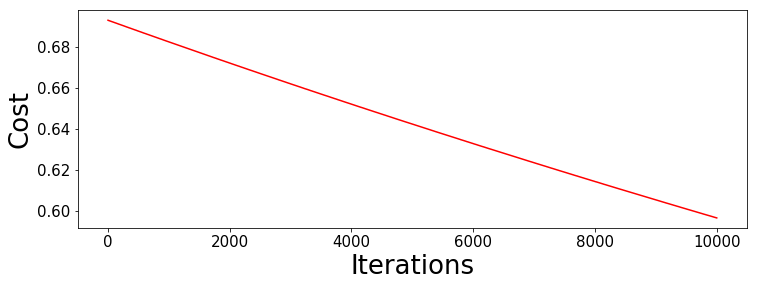

In [135]:
n=75
thresh=10000#0.05
alpha=0.0001
run(orig_data, theta, 10, STOP_ITER, thresh, alpha, n)
#run(orig_data1, theta1, 150, STOP_GRAD, thresh=0.005, alpha=0.001)

#### Getting the students' 

#### Combing the model calculation outputs and grades, Our model can give the calculated student learning outputs 

### 4. Write into csv

In [ ]:

csvfile = open('ho.csv', 'a')
writer = csv.writer(csvfile,dialect='excel',lineterminator='\n')
writer.writerow(['1', '2', '3','4','5'])
data = [
   [3,3,2],[4,4,2],[1,1,0],[2,2,2],[1,1,1]
]
writer.writerows(data)

csvfile.close()
1
2
3
4
5
6
7
8
9
csvfile = open('ho.csv', 'a')
writer = csv.writer(csvfile,dialect='excel',lineterminator='\n')
writer.writerow(['1', '2', '3','4','5'])
data = [
   [3,3,2],[4,4,2],[1,1,0],[2,2,2],[1,1,1]
]
writer.writerows(data)
 
csvfile.close()

### 5. Analyze the Results

In [ ]:
temp=np.array(np.zeros_like)